# Third Iteration

## 1. Downloading the necessary libraries

In [7]:
from onedrivedownloader import download
import os
import gdown
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from torch.nn import functional as F
from sklearn.neighbors import NearestNeighbors
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm  
import matplotlib.image as mpimg
from torch.utils.data import DataLoader
from torchvision import datasets
from sklearn.metrics.pairwise import cosine_similarity
from zipfile import ZipFile
import wget

## 2. Loading the base dataset

In the third iteration, there is **a single dataset** (the **base one with 252 images**), which serves as the basis for comparison with the user-provided image. The success of the task will be evaluated through visual comparison.

In [17]:
# Функция для загрузки и извлечения архива
def download_and_extract(url, output_file, folder_name):
    if os.path.exists(folder_name):
        print(f"{folder_name} folder already exists.")
    else:
        print(f"Downloading the {folder_name} folder")
        gdown.download(url, output_file, quiet=False)
        with ZipFile(output_file, 'r') as zip_ref:
            zip_ref.extractall("./" + folder_name)  # Извлекаем в подпапку с именем folder_name
        print(f"{folder_name} folder downloaded and extracted successfully.")

# URL и имя архива
cache_url = "https://drive.google.com/uc?id=1mVNZbjYMbflfN5QOhPdXVfVd1-NL6fOE"
output_cache = "cache_all.zip"

test_url = "https://drive.google.com/uc?id=1MOrihJmZa2zEbhrZTpMzHOChSjiexf9R"
output_test = "random_tests.zip"

# Вызываем функцию для загрузки и извлечения архива
download_and_extract(cache_url, output_cache, "cache_all")
download_and_extract(test_url, output_test, "random_tests")

cache_all folder already exists.


Downloading...
From: https://drive.google.com/uc?id=1MOrihJmZa2zEbhrZTpMzHOChSjiexf9R
To: C:\Users\totmi\Work Repository\Image match search\random_tests.zip
100%|██████████| 1.37M/1.37M [00:00<00:00, 3.65MB/s]

random_tests folder downloaded and extracted successfully.


Let's examine the image example from the **base dataset**.

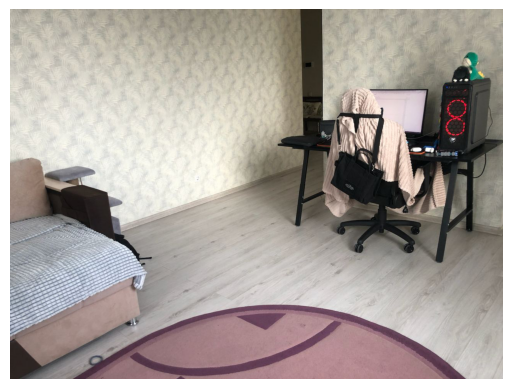

In [16]:
files = os.listdir('./cache_all/cache_all')

images = [file for file in files if file.endswith('.png') or file.endswith('.jpg')]

if images:
    image = os.path.join('./cache_all/cache_all', images[143])
    image_example = Image.open(image)
    plt.imshow(image_example)
    plt.axis('off')
    plt.show()
else:
    print("There is no any images in the folder.")

The following images are examples from the **test dataset**. In the third iteration, **the images of the rooms are designed to differ** as much as possible from one another. Some images are ambiguous. For example, there is a photograph in the dataset that shows only a ceiling and a lamp. 

This is done **to observe how the algorithms behave** and **to determine whether they will identify similar signs** on completely unfamiliar and dissimilar images from the basic dataset.

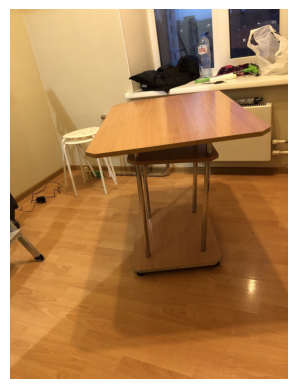

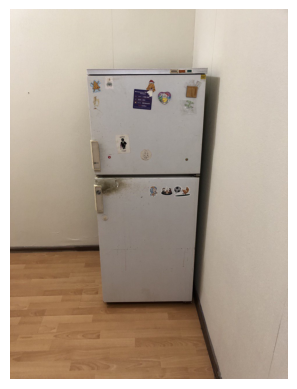

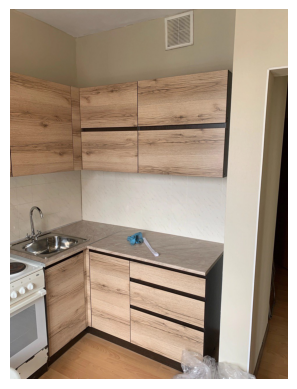

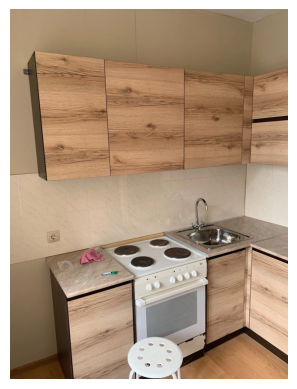

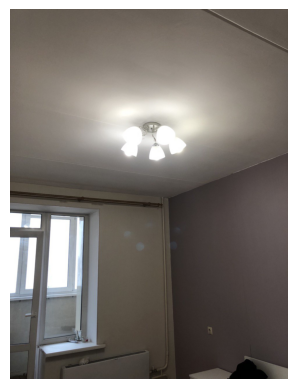

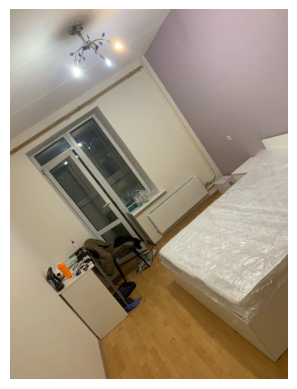

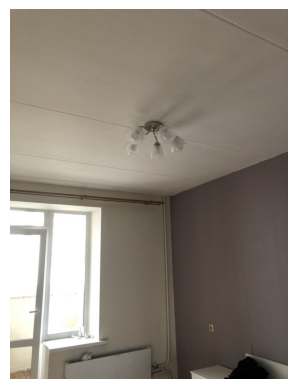

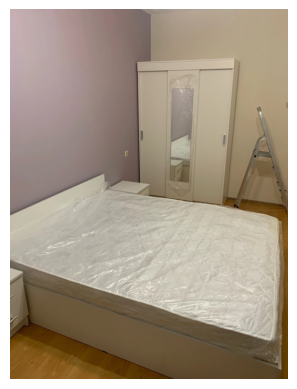

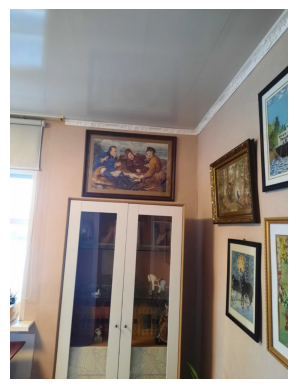

In [32]:
folder_path = './random_tests/random_tests'

files_test = os.listdir(folder_path)

images = [file for file in files_test if file.endswith('.png') or file.endswith('.jpg')]

if images:
    for image_name in images:
        image_path = os.path.join(folder_path, image_name)
        image_example = Image.open(image_path)
        plt.imshow(image_example)
        plt.axis('off')
        plt.show()
else:
    print("There is no any images in the folder.")

## 3. Image match search

### 3.1. Using Nearest Neighbors

C:\Users\totmi\anaconda\envs\anyloc\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\totmi\anaconda\envs\anyloc\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Processing test images: 100%|██████████| 9/9 [00:00<00:00, 14.76it/s]



Top-5 matches for the image 'photo_1_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_1_2024-04-25_21-39-59.jpg | kitchen28.jpg                  | 0.185370 |
|    2 | photo_1_2024-04-25_21-39-59.jpg | kitchen18.jpg                  | 0.197085 |
|    3 | photo_1_2024-04-25_21-39-59.jpg | kitchen27.jpg                  | 0.201757 |
|    4 | photo_1_2024-04-25_21-39-59.jpg | kitchen35.jpg                  | 0.204919 |
|    5 | photo_1_2024-04-25_21-39-59.jpg | bedroom20.jpg                  | 0.218444 |


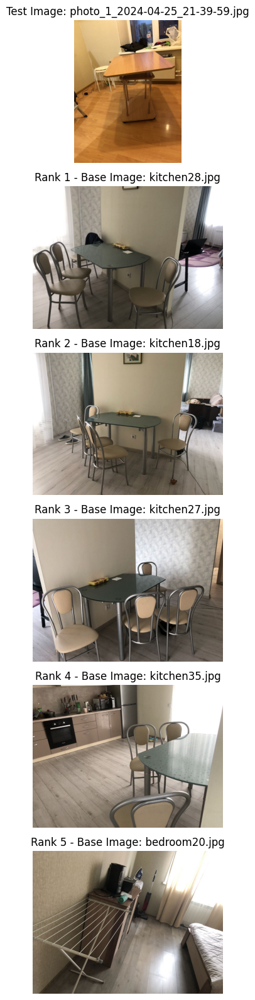


Top-5 matches for the image 'photo_2_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_2_2024-04-25_21-39-59.jpg | kitchen46.jpg                  | 0.225265 |
|    2 | photo_2_2024-04-25_21-39-59.jpg | kitchen44.jpg                  | 0.228895 |
|    3 | photo_2_2024-04-25_21-39-59.jpg | kitchen25.jpg                  | 0.236653 |
|    4 | photo_2_2024-04-25_21-39-59.jpg | kitchen10.jpg                  | 0.244625 |
|    5 | photo_2_2024-04-25_21-39-59.jpg | kitchen30.jpg                  | 0.248491 |


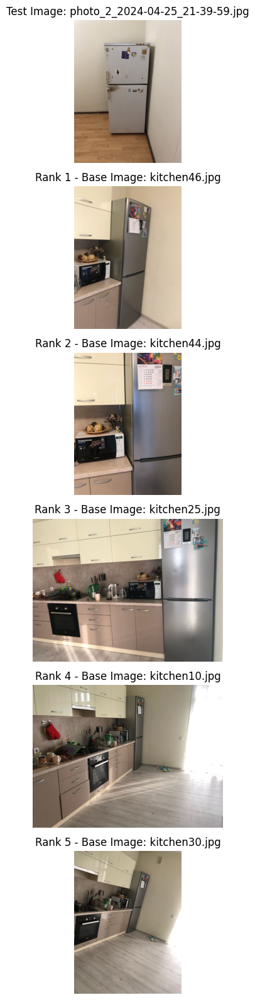


Top-5 matches for the image 'photo_3_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_3_2024-04-25_21-39-59.jpg | kitchen6.JPG                   | 0.205809 |
|    2 | photo_3_2024-04-25_21-39-59.jpg | kitchen34.jpg                  | 0.206590 |
|    3 | photo_3_2024-04-25_21-39-59.jpg | kitchen29.jpg                  | 0.213401 |
|    4 | photo_3_2024-04-25_21-39-59.jpg | kitchen16.jpg                  | 0.213715 |
|    5 | photo_3_2024-04-25_21-39-59.jpg | livingr32.JPG                  | 0.216104 |


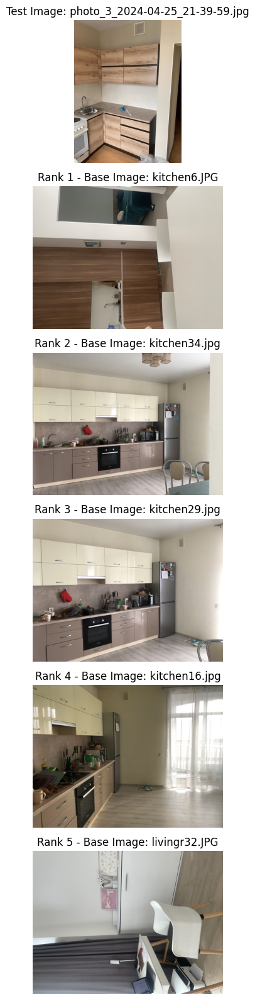


Top-5 matches for the image 'photo_4_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_4_2024-04-25_21-39-59.jpg | kitchen25.jpg                  | 0.163533 |
|    2 | photo_4_2024-04-25_21-39-59.jpg | kitchen47.jpg                  | 0.166265 |
|    3 | photo_4_2024-04-25_21-39-59.jpg | kitchen23.jpg                  | 0.172176 |
|    4 | photo_4_2024-04-25_21-39-59.jpg | kitchen49.jpg                  | 0.175093 |
|    5 | photo_4_2024-04-25_21-39-59.jpg | kitchen45.jpg                  | 0.177118 |


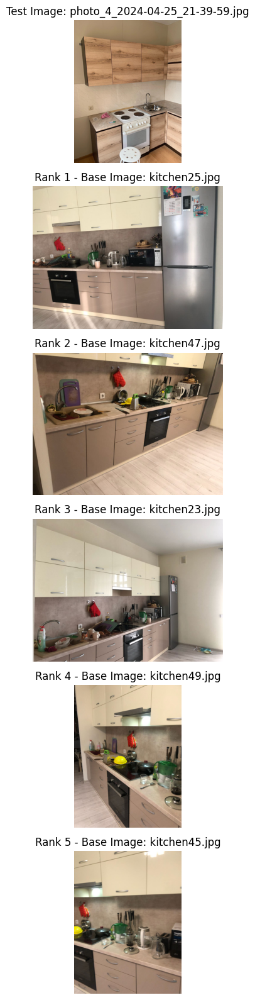


Top-5 matches for the image 'photo_5_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_5_2024-04-25_21-39-59.jpg | kitchen50.jpg                  | 0.164152 |
|    2 | photo_5_2024-04-25_21-39-59.jpg | bedroom21.jpg                  | 0.185973 |
|    3 | photo_5_2024-04-25_21-39-59.jpg | kitchen26.jpg                  | 0.191317 |
|    4 | photo_5_2024-04-25_21-39-59.jpg | kitchen21.jpg                  | 0.199159 |
|    5 | photo_5_2024-04-25_21-39-59.jpg | bedroom19.jpg                  | 0.218581 |


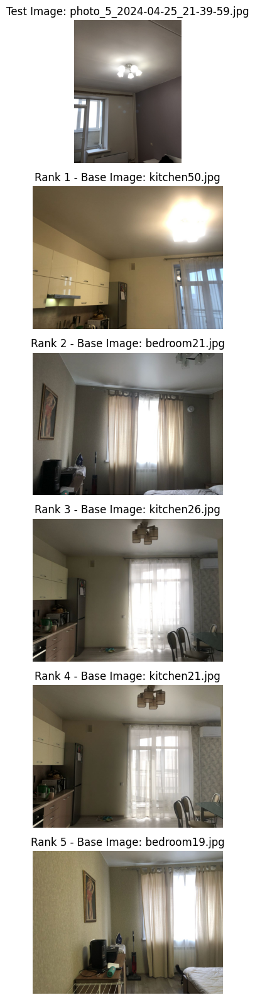


Top-5 matches for the image 'photo_6_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_6_2024-04-25_21-39-59.jpg | wardrobe40.jpg                 | 0.168456 |
|    2 | photo_6_2024-04-25_21-39-59.jpg | kitchen26.jpg                  | 0.191442 |
|    3 | photo_6_2024-04-25_21-39-59.jpg | kitchen21.jpg                  | 0.193472 |
|    4 | photo_6_2024-04-25_21-39-59.jpg | wardrobe43.jpg                 | 0.193501 |
|    5 | photo_6_2024-04-25_21-39-59.jpg | kitchen13.jpg                  | 0.194302 |


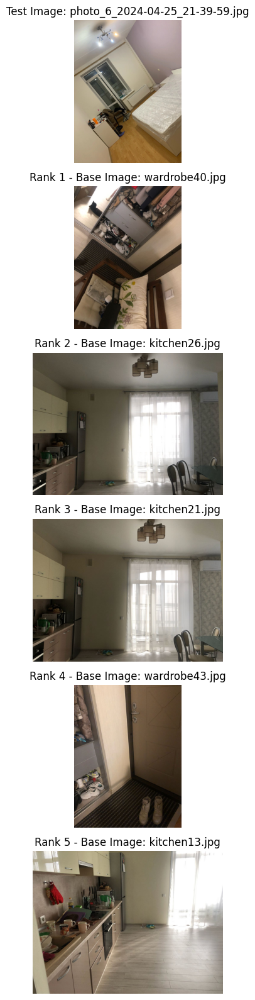


Top-5 matches for the image 'photo_7_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_7_2024-04-25_21-39-59.jpg | kitchen50.jpg                  | 0.175611 |
|    2 | photo_7_2024-04-25_21-39-59.jpg | bedroom21.jpg                  | 0.184179 |
|    3 | photo_7_2024-04-25_21-39-59.jpg | kitchen26.jpg                  | 0.193075 |
|    4 | photo_7_2024-04-25_21-39-59.jpg | bedroom19.jpg                  | 0.195281 |
|    5 | photo_7_2024-04-25_21-39-59.jpg | kitchen21.jpg                  | 0.209856 |


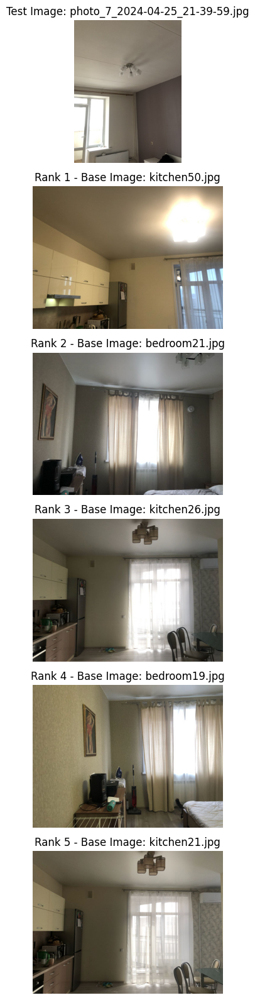


Top-5 matches for the image 'photo_8_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_8_2024-04-25_21-39-59.jpg | wardrobe43.jpg                 | 0.168473 |
|    2 | photo_8_2024-04-25_21-39-59.jpg | kitchen38.jpg                  | 0.200913 |
|    3 | photo_8_2024-04-25_21-39-59.jpg | wardrobe49.jpg                 | 0.201827 |
|    4 | photo_8_2024-04-25_21-39-59.jpg | kitchen6.JPG                   | 0.208003 |
|    5 | photo_8_2024-04-25_21-39-59.jpg | bedroom30.jpg                  | 0.209978 |


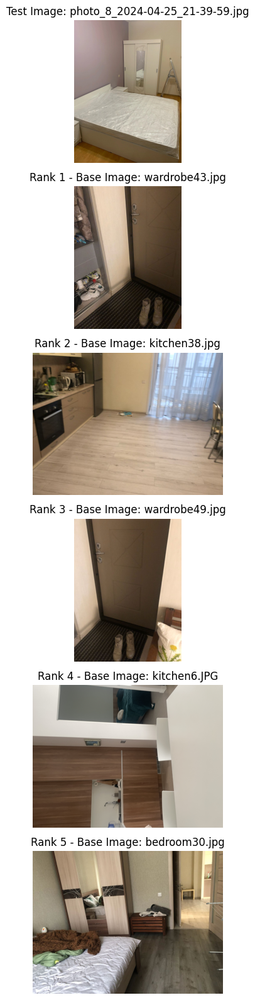


Top-5 matches for the image 'photo_9_2024-04-25_21-39-59.jpg':
------------------------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Distance |
------------------------------------------------------------------------------------------------------
|    1 | photo_9_2024-04-25_21-39-59.jpg | bedroom19.jpg                  | 0.267270 |
|    2 | photo_9_2024-04-25_21-39-59.jpg | livingr1.jpg                   | 0.272581 |
|    3 | photo_9_2024-04-25_21-39-59.jpg | wardrobe41.jpg                 | 0.274895 |
|    4 | photo_9_2024-04-25_21-39-59.jpg | kitchen26.jpg                  | 0.275905 |
|    5 | photo_9_2024-04-25_21-39-59.jpg | bedroom21.jpg                  | 0.278780 |


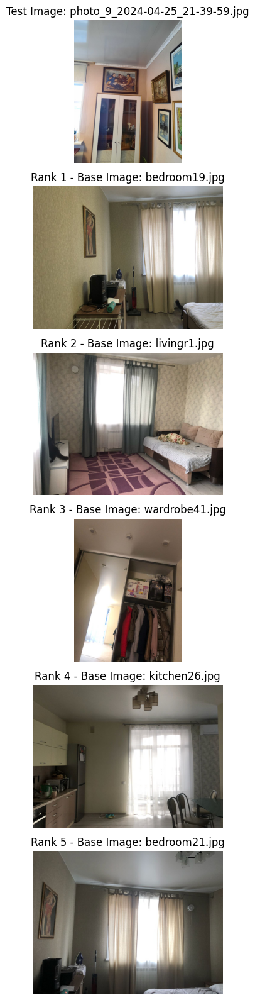

In [28]:
# Load the pre-trained ResNet model
model = models.resnet50(pretrained=True)
model.eval()

# Removing the last layers for classification
model = torch.nn.Sequential(*(list(model.children())[:-1]))

# Feature extraction
def extract_features(image_tensor):
    with torch.no_grad():
        features = model(image_tensor)
    features = features.squeeze().numpy()
    return features

# Loading, transforming and extracting features
# If we have an extra folder, just ignore it
def process_image(image_path):
    if '.ipynb_checkpoints' in image_path:
        return None
    
    # Download images
    image = Image.open(image_path)
    
    # Image transformation to tensor and normalization
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    # Applying transformations and extracting features
    input_tensor = preprocess(image)
    input_batch = input_tensor.unsqueeze(0)  # Add package dimensions for compatibility with the model.
    features = extract_features(input_batch)
    
    return features

# Prepare images from base database
base_directory = './cache_all/cache_all/'

database_features = []
database_labels = []
for file in tqdm(os.listdir(base_directory), desc='Processing base images'):
    file_path = os.path.join(base_directory, file)
    features = process_image(file_path)
    if features is not None:
        database_features.append(features)
        database_labels.append(file)

# Prepare images from test database
test_directory = './random_tests/random_tests'

test_features = []
test_labels = []
for file in tqdm(os.listdir(test_directory), desc='Processing test images'):
    file_path = os.path.join(test_directory, file)
    features = process_image(file_path)
    test_features.append(features)
    test_labels.append(file)


# Image Matching using Nearest Neighbors
def compare_images_nn(query_features, database_features, database_labels, k=5):
    nn = NearestNeighbors(n_neighbors=k, metric='cosine')
    nn.fit(database_features)
    distances, indices = nn.kneighbors([query_features], n_neighbors=k)
    return distances, indices


for i, (query_features, query_label) in enumerate(zip(test_features, test_labels)):
    distances, indices = compare_images_nn(query_features, database_features, database_labels)
    # Make a table to show the results
    print(f"\nTop-5 matches for the image '{query_label}':")
    print("------------------------------------------------------------------------------------------------------")
    print("| Rank | Test Image                    | Base Image                     | Distance |")
    print("------------------------------------------------------------------------------------------------------")
    for j, idx in enumerate(indices[0]):
        _, base_image_name = os.path.split(database_labels[idx])
        test_image_name = os.path.split(query_label)[-1]
        print(f"|  {j+1:3d} | {test_image_name:<30} | {base_image_name:<30} | {distances[0][j]:8.6f} |")

    # Display images
    fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 16))
    
    # Display the test image
    test_image_path = os.path.join(test_directory, query_label)
    test_image = mpimg.imread(test_image_path)
    axes[0].imshow(test_image)
    axes[0].set_title(f"Test Image: {query_label}")
    axes[0].axis('off')

    # Display the five most similar images from the base database
    for k, idx in enumerate(indices[0]):
        base_image_path = os.path.join(base_directory, database_labels[idx])
        base_image = mpimg.imread(base_image_path)
        _, base_image_name = os.path.split(database_labels[idx])
        axes[k+1].imshow(base_image)
        axes[k+1].set_title(f"Rank {k+1} - Base Image: {base_image_name}")
        axes[k+1].axis('off')

    plt.tight_layout()
    plt.show()


### 3.2. Using Correspondence to other classes


Top-5 matches for the image 'photo_1_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_1_2024-04-25_21-39-59.jpg | kitchen28.jpg                  |   0.814631 |
|    2 | photo_1_2024-04-25_21-39-59.jpg | kitchen18.jpg                  |   0.802915 |
|    3 | photo_1_2024-04-25_21-39-59.jpg | kitchen27.jpg                  |   0.798243 |
|    4 | photo_1_2024-04-25_21-39-59.jpg | kitchen35.jpg                  |   0.795081 |
|    5 | photo_1_2024-04-25_21-39-59.jpg | bedroom20.jpg                  |   0.781556 |


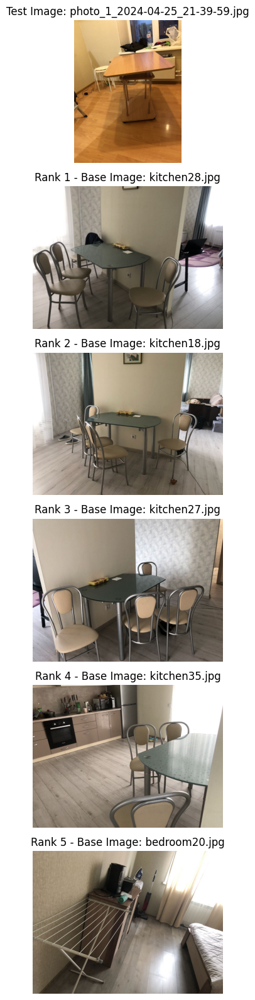


Top-5 matches for the image 'photo_2_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_2_2024-04-25_21-39-59.jpg | kitchen46.jpg                  |   0.774735 |
|    2 | photo_2_2024-04-25_21-39-59.jpg | kitchen44.jpg                  |   0.771105 |
|    3 | photo_2_2024-04-25_21-39-59.jpg | kitchen25.jpg                  |   0.763347 |
|    4 | photo_2_2024-04-25_21-39-59.jpg | kitchen10.jpg                  |   0.755375 |
|    5 | photo_2_2024-04-25_21-39-59.jpg | kitchen30.jpg                  |   0.751509 |


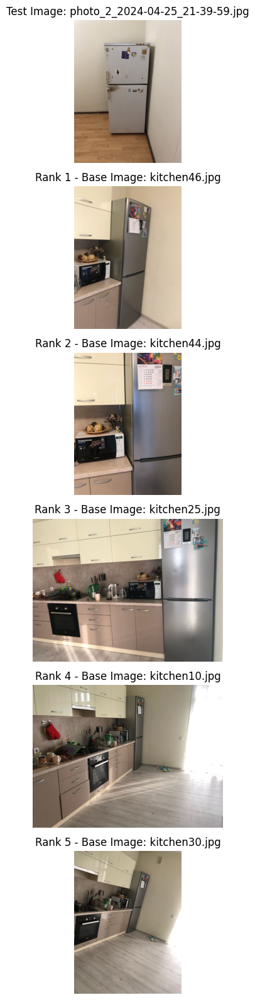


Top-5 matches for the image 'photo_3_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_3_2024-04-25_21-39-59.jpg | kitchen6.JPG                   |   0.794191 |
|    2 | photo_3_2024-04-25_21-39-59.jpg | kitchen34.jpg                  |   0.793410 |
|    3 | photo_3_2024-04-25_21-39-59.jpg | kitchen29.jpg                  |   0.786599 |
|    4 | photo_3_2024-04-25_21-39-59.jpg | kitchen16.jpg                  |   0.786285 |
|    5 | photo_3_2024-04-25_21-39-59.jpg | livingr32.JPG                  |   0.783896 |


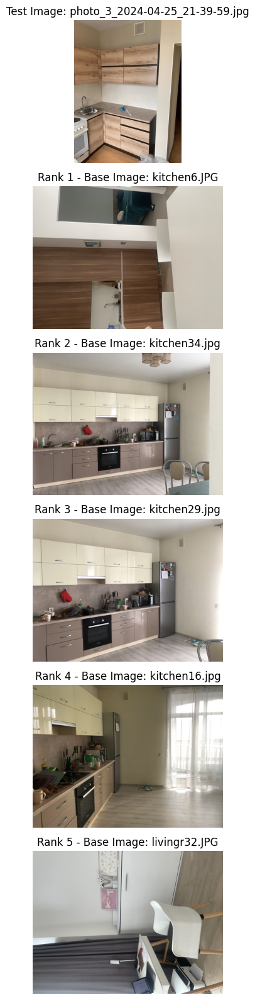


Top-5 matches for the image 'photo_4_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_4_2024-04-25_21-39-59.jpg | kitchen25.jpg                  |   0.836467 |
|    2 | photo_4_2024-04-25_21-39-59.jpg | kitchen47.jpg                  |   0.833735 |
|    3 | photo_4_2024-04-25_21-39-59.jpg | kitchen23.jpg                  |   0.827824 |
|    4 | photo_4_2024-04-25_21-39-59.jpg | kitchen49.jpg                  |   0.824907 |
|    5 | photo_4_2024-04-25_21-39-59.jpg | kitchen45.jpg                  |   0.822882 |


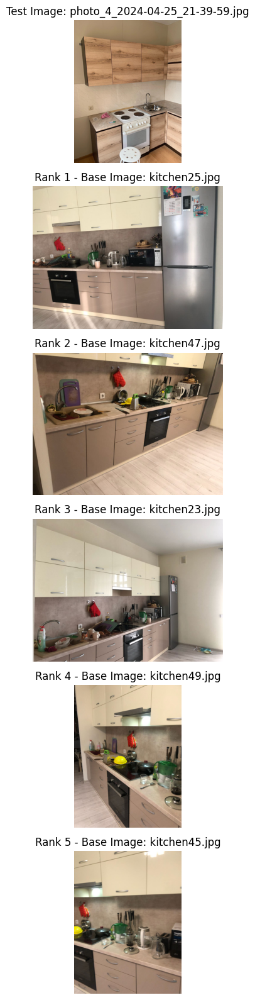


Top-5 matches for the image 'photo_5_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_5_2024-04-25_21-39-59.jpg | kitchen50.jpg                  |   0.835848 |
|    2 | photo_5_2024-04-25_21-39-59.jpg | bedroom21.jpg                  |   0.814027 |
|    3 | photo_5_2024-04-25_21-39-59.jpg | kitchen26.jpg                  |   0.808683 |
|    4 | photo_5_2024-04-25_21-39-59.jpg | kitchen21.jpg                  |   0.800841 |
|    5 | photo_5_2024-04-25_21-39-59.jpg | bedroom19.jpg                  |   0.781419 |


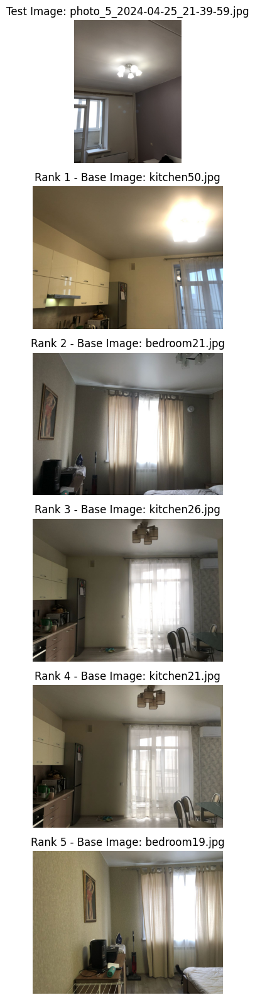


Top-5 matches for the image 'photo_6_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_6_2024-04-25_21-39-59.jpg | wardrobe40.jpg                 |   0.831544 |
|    2 | photo_6_2024-04-25_21-39-59.jpg | kitchen26.jpg                  |   0.808558 |
|    3 | photo_6_2024-04-25_21-39-59.jpg | kitchen21.jpg                  |   0.806528 |
|    4 | photo_6_2024-04-25_21-39-59.jpg | wardrobe43.jpg                 |   0.806499 |
|    5 | photo_6_2024-04-25_21-39-59.jpg | kitchen13.jpg                  |   0.805698 |


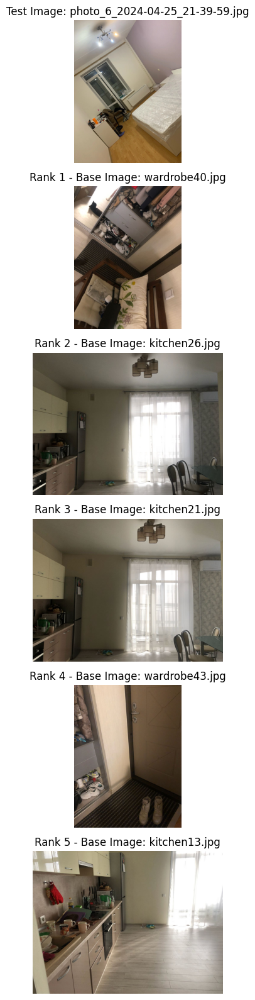


Top-5 matches for the image 'photo_7_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_7_2024-04-25_21-39-59.jpg | kitchen50.jpg                  |   0.824389 |
|    2 | photo_7_2024-04-25_21-39-59.jpg | bedroom21.jpg                  |   0.815821 |
|    3 | photo_7_2024-04-25_21-39-59.jpg | kitchen26.jpg                  |   0.806925 |
|    4 | photo_7_2024-04-25_21-39-59.jpg | bedroom19.jpg                  |   0.804719 |
|    5 | photo_7_2024-04-25_21-39-59.jpg | kitchen21.jpg                  |   0.790145 |


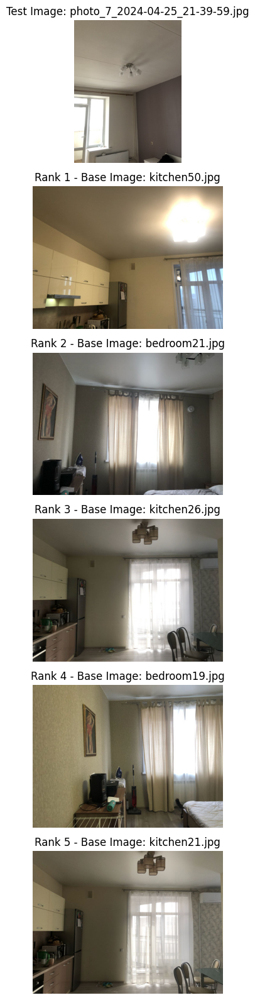


Top-5 matches for the image 'photo_8_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_8_2024-04-25_21-39-59.jpg | wardrobe43.jpg                 |   0.831527 |
|    2 | photo_8_2024-04-25_21-39-59.jpg | kitchen38.jpg                  |   0.799087 |
|    3 | photo_8_2024-04-25_21-39-59.jpg | wardrobe49.jpg                 |   0.798173 |
|    4 | photo_8_2024-04-25_21-39-59.jpg | kitchen6.JPG                   |   0.791997 |
|    5 | photo_8_2024-04-25_21-39-59.jpg | bedroom30.jpg                  |   0.790022 |


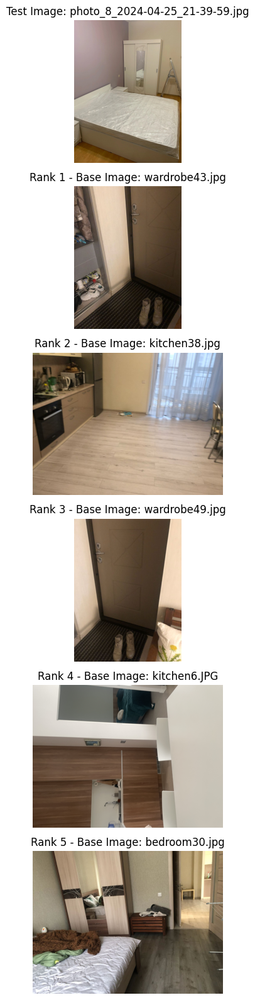


Top-5 matches for the image 'photo_9_2024-04-25_21-39-59.jpg':
-----------------------------------------------------------------------------------------
| Rank | Test Image                    | Base Image                     | Similarity |
----------------------------------------------------------------------------------------
|    1 | photo_9_2024-04-25_21-39-59.jpg | bedroom19.jpg                  |   0.732730 |
|    2 | photo_9_2024-04-25_21-39-59.jpg | livingr1.jpg                   |   0.727419 |
|    3 | photo_9_2024-04-25_21-39-59.jpg | wardrobe41.jpg                 |   0.725105 |
|    4 | photo_9_2024-04-25_21-39-59.jpg | kitchen26.jpg                  |   0.724095 |
|    5 | photo_9_2024-04-25_21-39-59.jpg | bedroom21.jpg                  |   0.721220 |


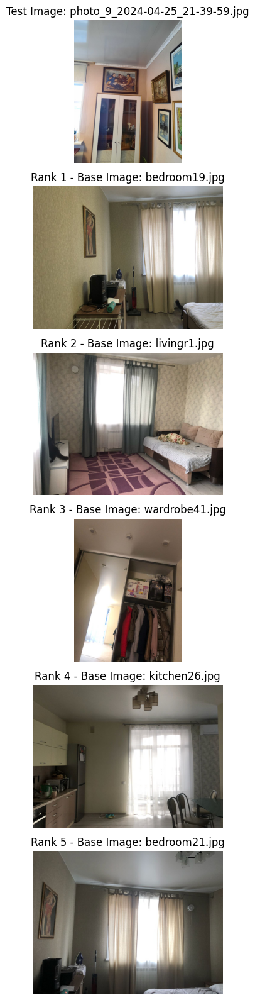

In [31]:
# Image Matching using Correspondence to other classes
def compare_images_correspondence(query_features, database_features, test_label, k=5):
    similarities = cosine_similarity([query_features], database_features)
    indices = similarities.argsort()[0][-k:][::-1]
    return indices


for i, (query_features, query_label) in enumerate(zip(test_features, test_labels)):
    indices = compare_images_correspondence(query_features, database_features, os.path.split(query_label)[0])
    
    # Also beautiful result
    print(f"\nTop-5 matches for the image '{query_label}':")
    print("-----------------------------------------------------------------------------------------")
    print("| Rank | Test Image                    | Base Image                     | Similarity |")
    print("----------------------------------------------------------------------------------------")
    for j, idx in enumerate(indices):
        base_image_folder, base_image_name = os.path.split(database_labels[idx])  # Splitting the path into folder and filename
        test_image_folder, test_image_name = os.path.split(query_label)  # Splitting the path into folder and filename
        similarity = cosine_similarity([query_features], [database_features[idx]])[0][0]
        print(f"|  {j+1:3d} | {test_image_name:<30} | {base_image_name:<30} | {similarity:10.6f} |")
    
    # Image output
    fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(8, 16))
    
    # Image output from the test dataset
    test_image_path = os.path.join(test_directory, query_label)
    test_image = mpimg.imread(test_image_path)
    axes[0].imshow(test_image)
    axes[0].set_title(f"Test Image: {query_label}")
    axes[0].axis('off')

    # Output of the five closest images from the base dataset
    for k, idx in enumerate(indices):
        base_image_path = os.path.join(base_directory, database_labels[idx])
        base_image = mpimg.imread(base_image_path)
        axes[k+1].imshow(base_image)
        axes[k+1].set_title(f"Rank {k+1} - Base Image: {database_labels[idx]}")
        axes[k+1].axis('off')

    plt.tight_layout()
    plt.show()

Done